# Searching Terms in OCR

## Importing Libraries

In [1]:
import pytesseract
from pytesseract import Output
import numpy as np
import cv2
import os
import re
import matplotlib.pyplot as plt
from PIL import ImageFont, ImageDraw, Image

## Visualizing Image

In [2]:
def cv2_imshow(img, gray=True):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.grid(False)
    plt.axis(False)
    if gray:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(img)
    plt.show()

In [3]:
directory_images = "Sources/Images/Images Project 1"
paths = [os.path.join(directory_images, f) for f in os.listdir(directory_images)]
paths

['Sources/Images/Images Project 1/ebook_sistemasoperacionais.jpg',
 'Sources/Images/Images Project 1/artigo_introducao_vc.jpg',
 'Sources/Images/Images Project 1/referencias_artigo.jpg',
 'Sources/Images/Images Project 1/receita02.jpg',
 'Sources/Images/Images Project 1/informacao_nutricional.jpg',
 'Sources/Images/Images Project 1/prefacio_tanenbaum.jpg',
 'Sources/Images/Images Project 1/caixa-refrigerador.jpg']

In [4]:
def show_img(img):
    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    plt.axis(False)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

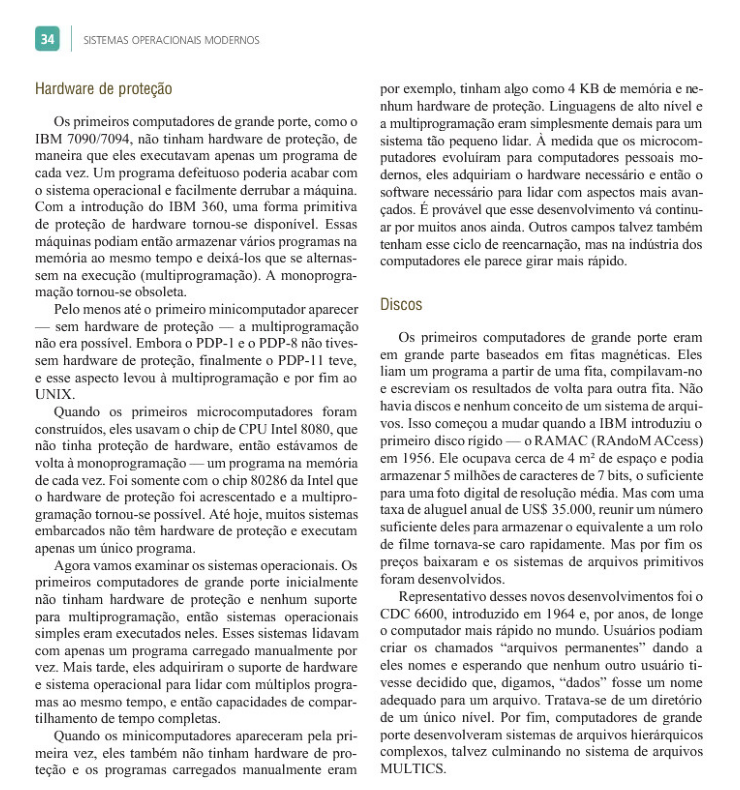

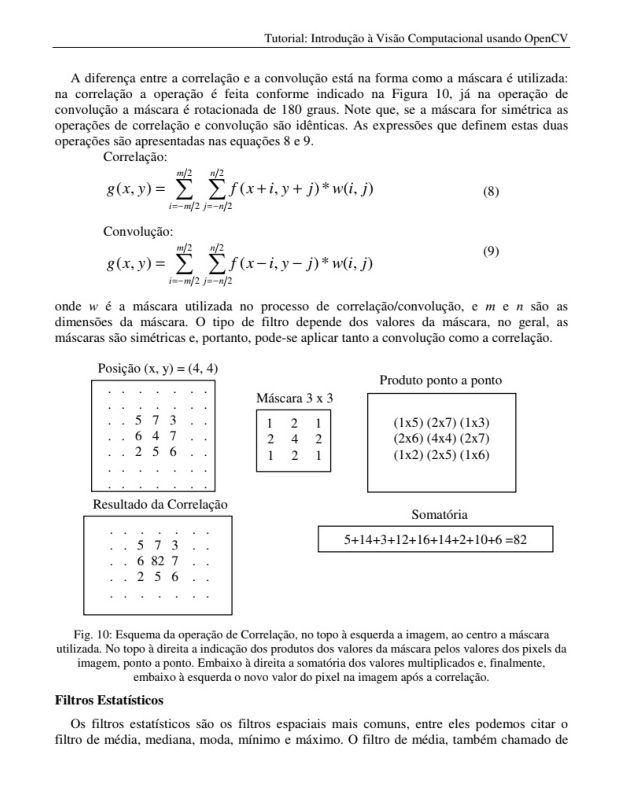

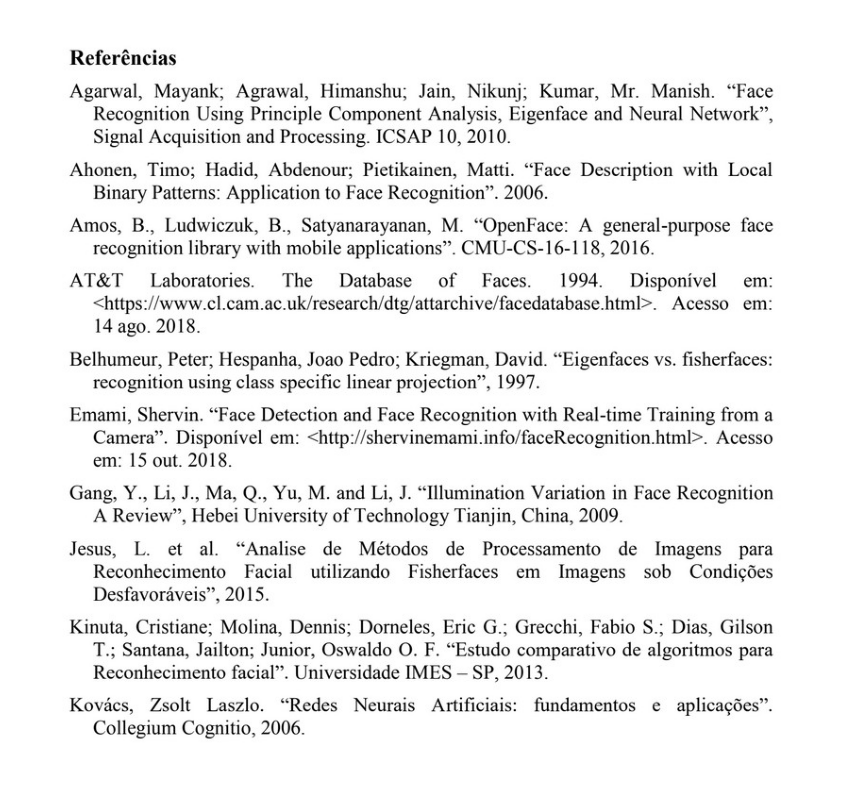

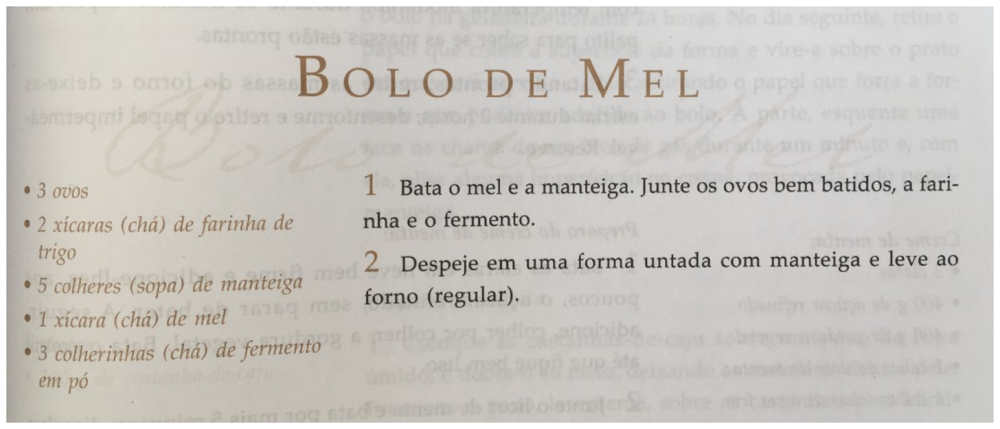

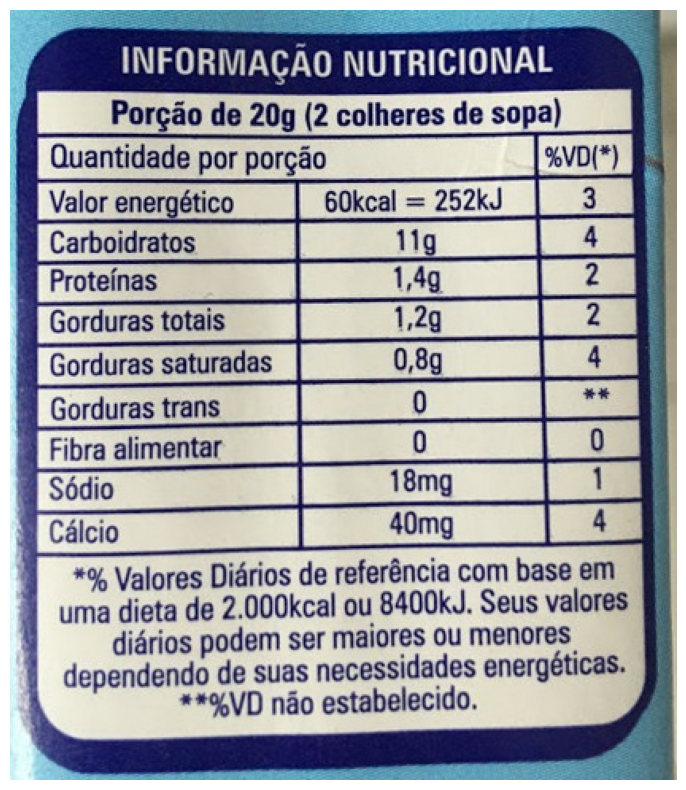

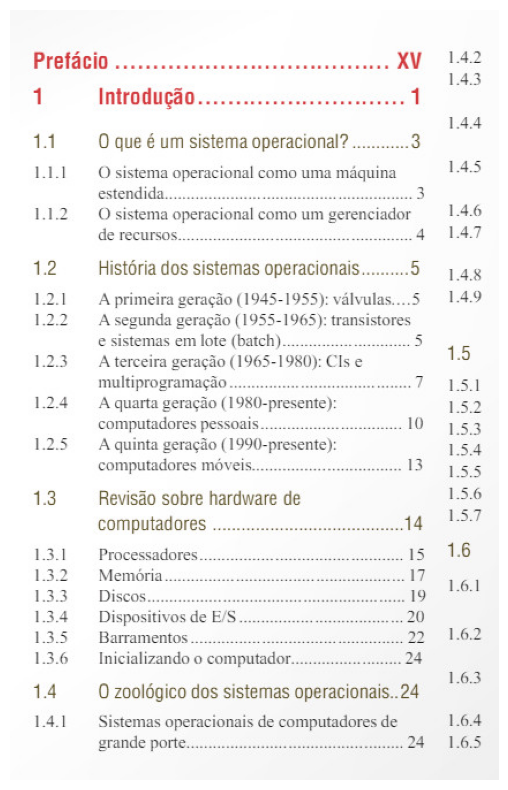

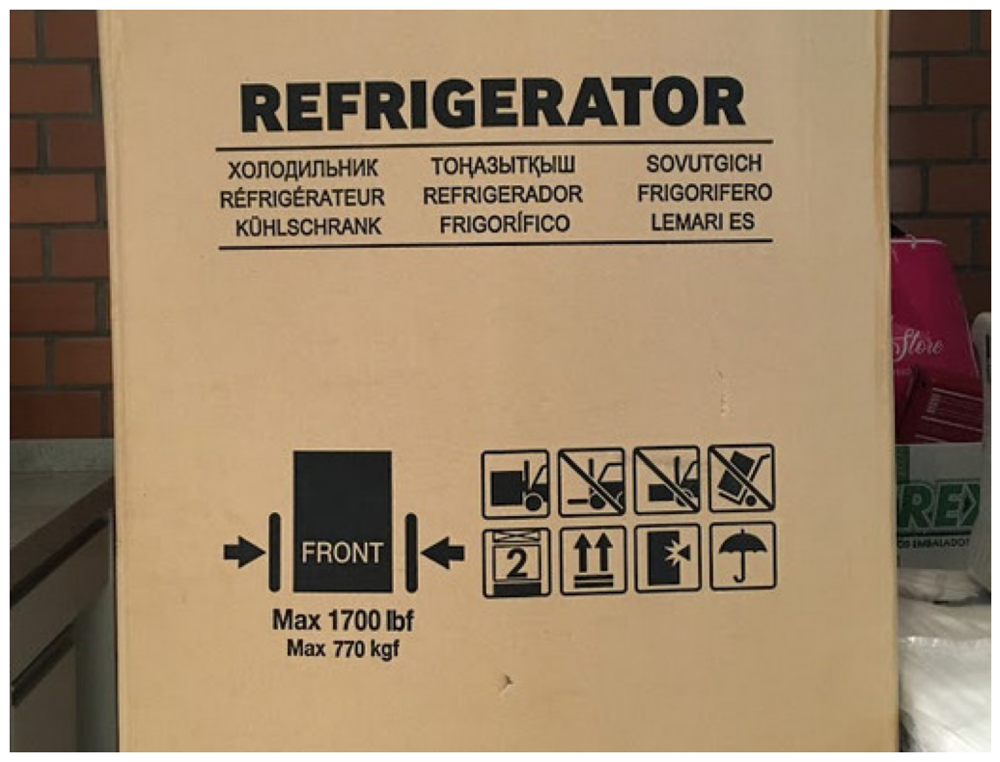

In [5]:
for image in paths:
    image = cv2.imread(image)
    show_img(image)

## Tesseract Settings

In [6]:
config_tesseract = "--tessdata-dir tessdata"
def tesseract_ocr(img, config=config_tesseract):
    text = pytesseract.image_to_string(img, lang='por', config=config)
    return text

## Text Recognition

In [7]:
full_text = ''
txt_file = 'results_ocr.txt'

In [8]:
for image in paths:
    img = cv2.imread(image)
    file_image = os.path.split(image)[-1]
    file_image_separate = '=============\n' + file_image
    full_text = full_text + file_image_separate + '\n'
    text = tesseract_ocr(img)
    full_text = full_text + text

In [9]:
full_text

'=============\nebook_sistemasoperacionais.jpg\nHardware de proteção\n\nOs primeiros computadores de grande porte, como o\nIBM 7090/7094, não tinham hardware de proteção, de\nmaneira que eles exccutavam apenas um programa de\ncada vez. Um programa defeituoso poderia acabar com\n| sistema operacional e facilmente derrubar a máquina.\n\nCom a introdução do IBM 360, uma forma primitiva\nde proteção de hardware tornou-se disponível. Essas\nmáquinas podiam então armazenar vários programas na\nmemória ao mesmo tempo e deixá-los que se alternas-\n\nsem na execução (multiprogramação). À monoprogra-\nmação tornou-se obsoleta.\n\nPelo menos até o primeiro minicomputador aparecer\n— sem hardware de proteção — a multiprogramação\nnão era possível. Embora o PDP-1 e o PDP-8 não tives-\nsem hardware de proteção, finalmente o PDP-11 teve,\n€ esse aspecto levou à multiprogramação e por fim ao\nUNIX.\n\nQuando os primeiros microcomputadores foram\nconstruídos, eles usavam o chip de CPU Intel 8080, que\n

## Saving the results

In [10]:
file_txt = open(txt_file, 'w+')
file_txt.write(full_text + '\n')
file_txt.close()

## Searching in txt file

In [11]:
term_search = 'computador'

In [12]:
with open('results_ocr.txt') as f:
    results = [i.start() for i in re.finditer(term_search, f.read())]

In [13]:
results, len(results)

([80,
  639,
  898,
  1374,
  1826,
  2196,
  2496,
  2561,
  3418,
  3700,
  8416,
  8477,
  8528,
  8637,
  8720],
 15)

## Searching in the images

In [14]:
for image in paths:
    img = cv2.imread(image)
    file_image = os.path.split(image)[-1]
    print('===========\n' + str(file_image))
    text = tesseract_ocr(img)
    results = [i.start() for i in re.finditer(term_search, text)]
    print(f'Number of times the term {term_search} appears: {len(results)}')
    print('\n')

ebook_sistemasoperacionais.jpg
Number of times the term computador appears: 10


artigo_introducao_vc.jpg
Number of times the term computador appears: 0


referencias_artigo.jpg
Number of times the term computador appears: 0


receita02.jpg
Number of times the term computador appears: 0


informacao_nutricional.jpg
Number of times the term computador appears: 0


prefacio_tanenbaum.jpg
Number of times the term computador appears: 5


caixa-refrigerador.jpg
Number of times the term computador appears: 0



## Word Cloud

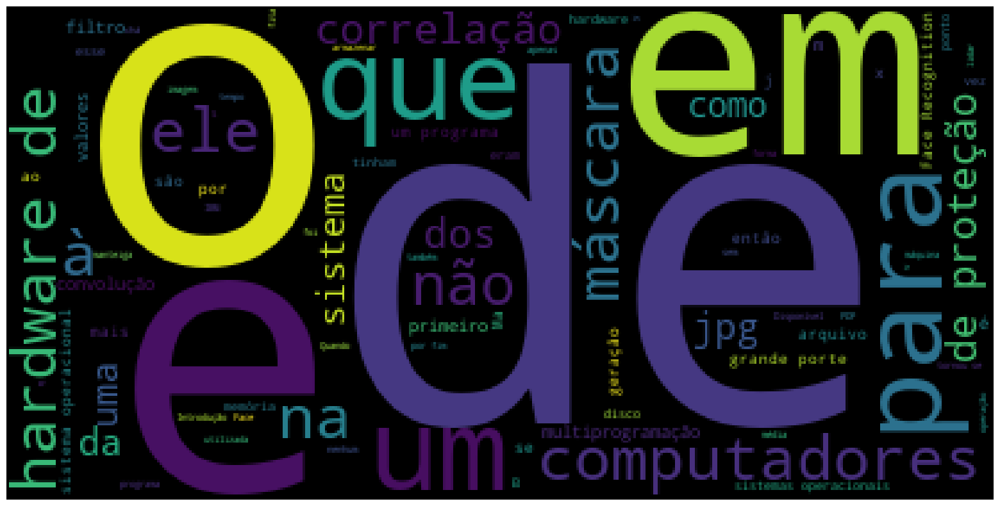

In [15]:
import spacy

from wordcloud import WordCloud
plt.figure(figsize=(20, 10))
plt.imshow(WordCloud().generate(full_text))
plt.axis(False)
plt.show()

In [16]:
nlp_en = spacy.load('en_core_web_sm')

In [17]:
print(spacy.lang.en.stop_words.STOP_WORDS)

{'four', 'what', 'less', 'below', 'must', 'just', 'enough', 'thereby', 'out', 'there', 'side', 'why', 'back', "'ve", 'toward', 'n‘t', 'cannot', 'nevertheless', 'get', 'sometime', '‘m', 'against', 'anyhow', 'so', '’ve', 'call', 'more', 'up', "'d", 'may', 'does', 'mostly', 'themselves', '’d', 'go', 'under', 'with', 'who', 'every', 'indeed', 'via', 'anywhere', 'seems', 'between', 'becomes', 'really', 'already', 'an', 'hers', 'since', 'wherein', 'all', 'then', 'whereafter', 'whenever', 'neither', 'sixty', 'our', '‘s', 'quite', 'was', '‘ll', 'unless', 'part', 'thereafter', 'beside', 'which', 'everywhere', 'perhaps', 'seemed', 'will', 'whither', 'either', 'here', 'after', 'six', 'i', 'whom', 'eleven', 'few', 'down', '‘re', 'twelve', 'when', 'meanwhile', 'how', 'becoming', 'have', 'hereby', 'name', 'across', 'as', 'formerly', 'my', 'that', 'yourself', 'ours', 'third', 'throughout', 'around', 'nine', 'anyone', 'various', 'and', 'are', 'in', 'together', 'being', '’re', 'by', 'namely', 'most', '

In [18]:
len(spacy.lang.en.stop_words.STOP_WORDS)

326

In [19]:
nlp = spacy.load('pt_core_news_sm')

In [20]:
stop_words = spacy.lang.pt.stop_words.STOP_WORDS
print(stop_words)

{'atrás', 'novo', 'cá', 'algumas', 'quinta', 'mil', 'ter', 'quieto', 'iniciar', 'próximo', 'porém', 'vez', 'à', 'forma', 'desde', 'és', 'povo', 'vossas', 'daquele', 'de', 'inicio', 'nesse', 'pois', 'baixo', 'sem', 'obrigado', 'caminho', 'mesmo', 'valor', 'seria', 'vários', 'menor', 'para', 'apontar', 'tentar', 'foram', 'local', 'nas', 'este', 'tentei', 'mal', 'mais', 'parece', 'lado', 'dos', 'ir', 'sim', 'usar', 'isto', 'aquele', 'cuja', 'temos', 'sabe', 'quer', 'num', 'tudo', 'dizem', 'diante', 'pouco', 'algo', 'tão', 'contra', 'agora', 'dezanove', 'desse', 'vezes', 'estiveste', 'meio', 'meu', 'daquela', 'sua', 'relação', 'aquilo', 'poder', 'aquelas', 'até', 'só', 'devem', 'pontos', 'aqui', 'menos', 'tarde', 'sexto', 'nossos', 'fazem', 'duas', 'bem', 'foi', 'portanto', 'aos', 'nos', 'como', 'pode', 'quanto', 'certamente', 'poderá', 'contudo', 'deve', 'apoio', 'disso', 'desta', 'vindo', 'nossa', 'essas', 'último', 'dezasseis', 'as', 'possivelmente', 'nuns', 'qual', 'quarta', 'final', '

In [21]:
len(stop_words)

416

In [22]:
def preprocessing(text):
    text = text.lower()
    document = nlp(text)
    tokens_list = []
    for token in document:
        # print(token)
        tokens_list.append(token.text)
    # print(tokens_list)
    tokens = [word for word in tokens_list if word not in stop_words]
    # print(tokens)
    tokens = ' '.join([str(element) for element in tokens])
    # print(tokens)
    return tokens

In [23]:
preprocessing('Note que, se a máscara for simétrica as operações de correlação')

'note , máscara simétrica operações correlação'

In [24]:
processed_full_text = preprocessing(full_text)

In [25]:
len(full_text), len(processed_full_text), len(full_text) - len(processed_full_text)

(9049, 8025, 1024)

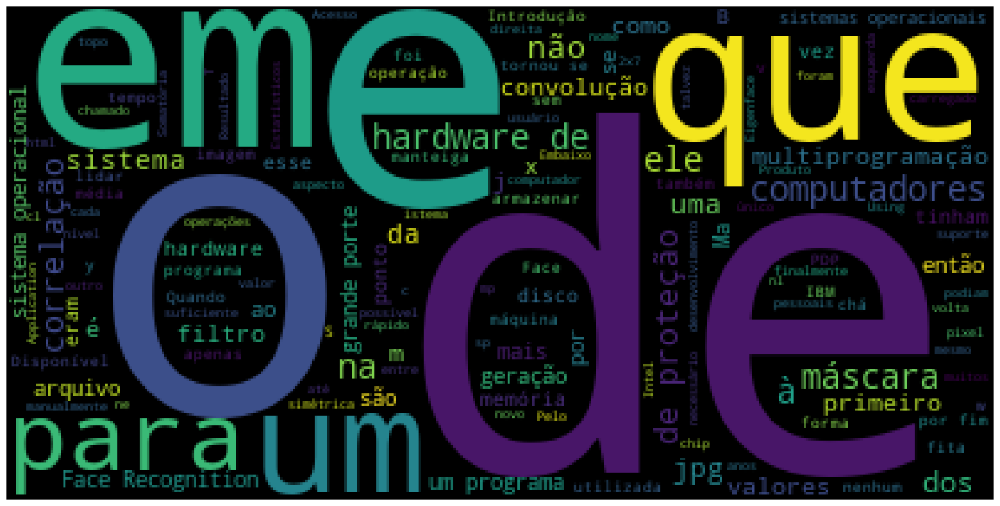

In [26]:
plt.figure(figsize=(20, 10))
plt.imshow(WordCloud().generate(full_text))
plt.axis(False)
plt.show()

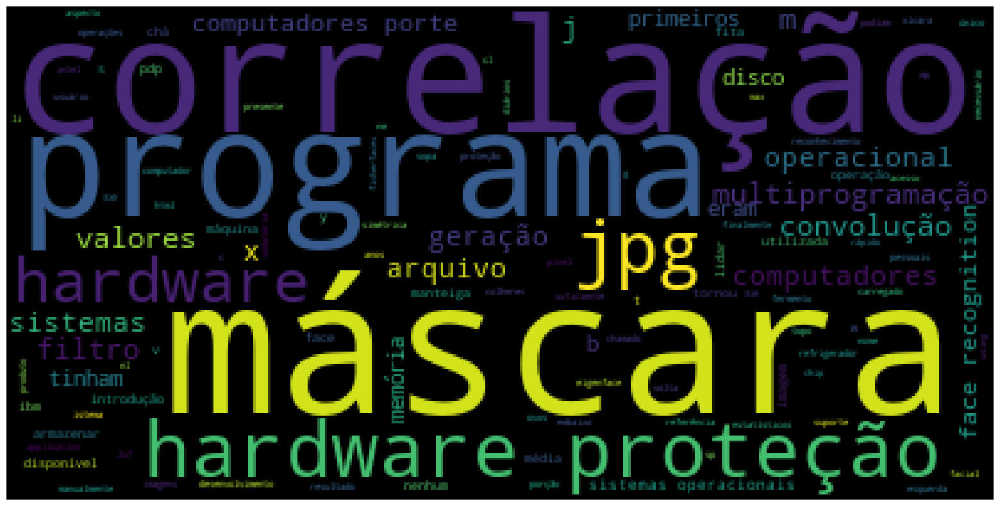

In [27]:
plt.figure(figsize=(20, 10))
plt.imshow(WordCloud().generate(processed_full_text))
plt.axis(False)
plt.show()

## Named Entity Recognition

In [28]:
document = nlp(processed_full_text)

In [29]:
from spacy import displacy
displacy.render(document, style='ent', jupyter=True)

In [30]:
for entity in document.ents:
    if entity.label_ == 'PER':
        print(entity.text, entity.label_)

meira PER
liam programa fita PER
manish PER
icsap PER
matti PER
b. PER
satyanarayanan PER
library with PER
cmu-cs-16-118,2016 PER
peter PER
hespanha PER
joao pedro PER
kriegman PER
david PER
shervin PER
j. PER
ma PER
j. “ illumination variation in face recognition PER
l. et al PER
dennis PER
eric g. PER
fabio s. PER
gilson PER
oswaldo o. PER
kovács PER


## Text Recognition in the images

### Function to write in the image

In [31]:
font = 'Sources/Fonts/calibri.ttf'

In [32]:
def write_text(text, x, y, img, font, color=(50, 50, 255), font_size=16):
    font = ImageFont.truetype(font, font_size)
    img_pil = Image.fromarray(img)
    draw = ImageDraw.Draw(img_pil)
    draw.text((x, y-font_size), text, font=font, fill=color)
    img = np.array(img_pil)
    return img

### Function to show the detections

In [33]:
min_conf = 30

In [34]:
def box(i, result, img, color=(255, 100, 0)):
    x = result["left"][i]
    y = result["top"][i]
    w = result["width"][i]
    h = result["height"][i]
    
    cv2.rectangle(img, (x, y), (x+w, y+h), color, 2)
    return x, y, img

In [35]:
def ocr_process_image(img, term_search, config_tesseract, min_conf):
    result = pytesseract.image_to_data(img, config=config_tesseract, lang='por', output_type=Output.DICT)
    number_of_times = 0
    for i in range(0, len(result['text'])):
        confidence = int(result['conf'][i])
        if confidence > min_conf:
            text = result['text'][i]
            if term_search.lower() in text.lower():
                x, y, img = box(i, result, img, (0, 0, 255))
                img = write_text(text, x, y, img, font, (50, 50, 225), 14)
                number_of_times += 1
    return img, number_of_times

### Searching for specific terms

ebook_sistemasoperacionais.jpg
Number of times term computador appears in ebook_sistemasoperacionais.jpg: 10


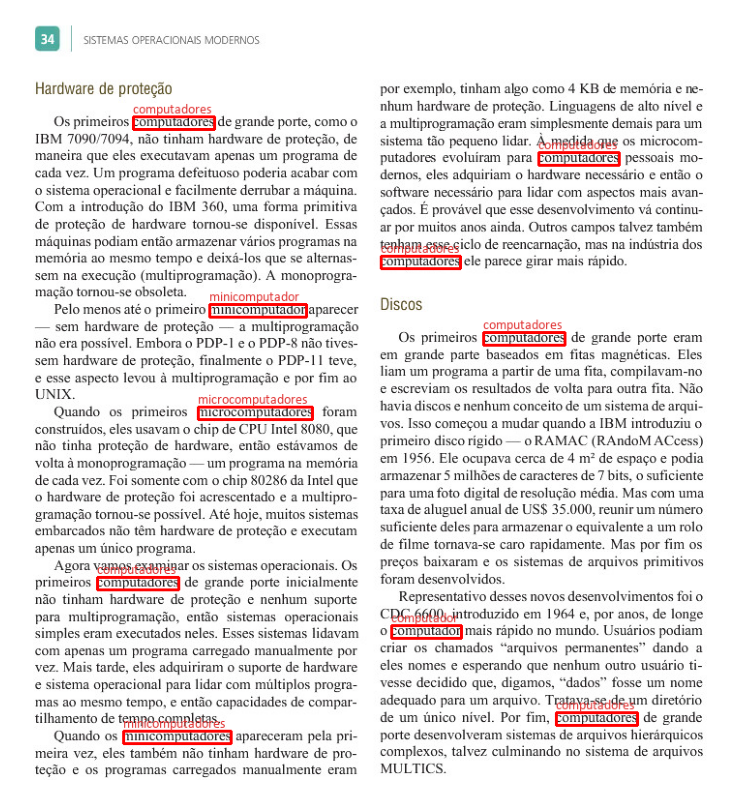

artigo_introducao_vc.jpg
Number of times term computador appears in artigo_introducao_vc.jpg: 0


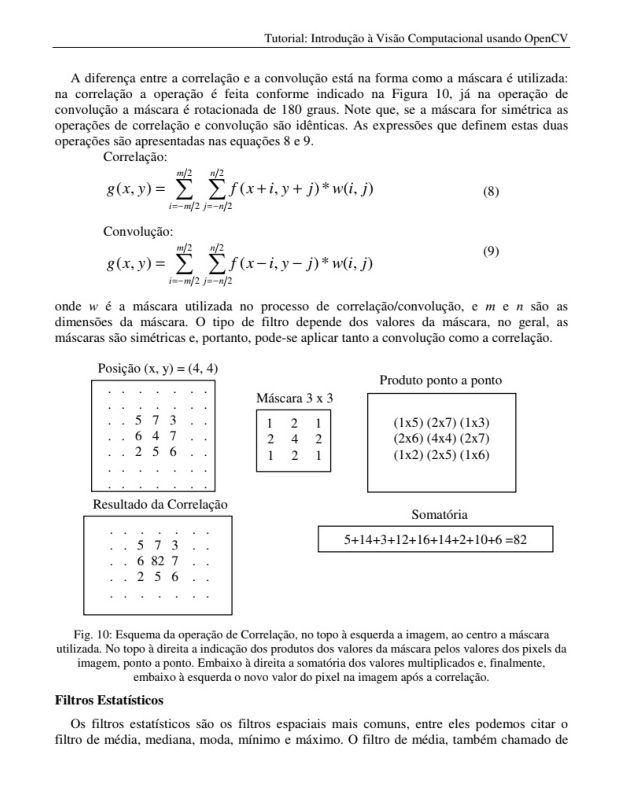

referencias_artigo.jpg
Number of times term computador appears in referencias_artigo.jpg: 0


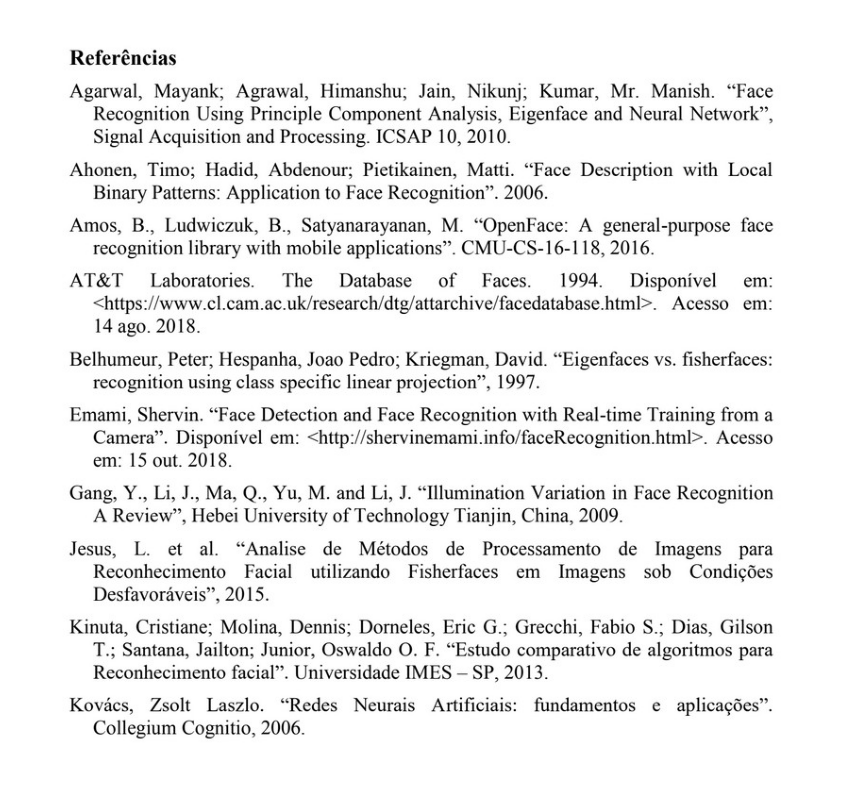

receita02.jpg
Number of times term computador appears in receita02.jpg: 0


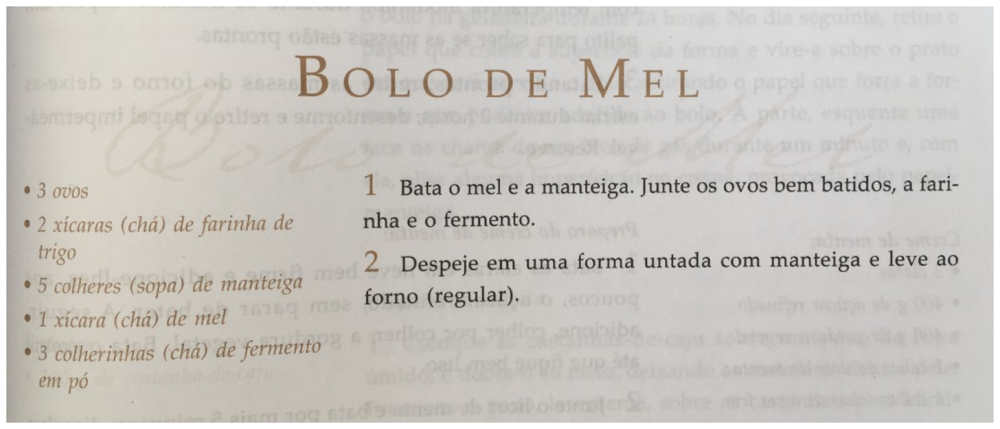

informacao_nutricional.jpg
Number of times term computador appears in informacao_nutricional.jpg: 0


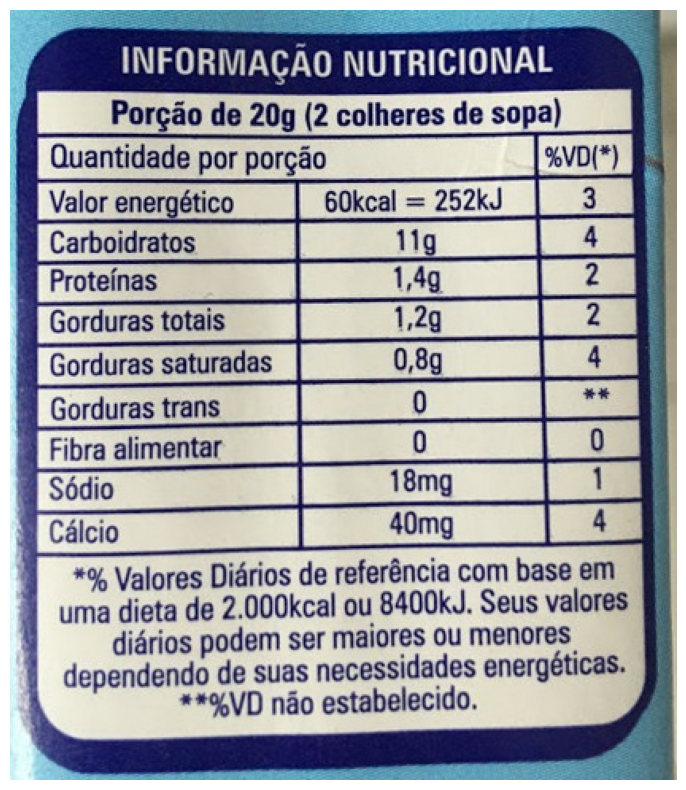

prefacio_tanenbaum.jpg
Number of times term computador appears in prefacio_tanenbaum.jpg: 5


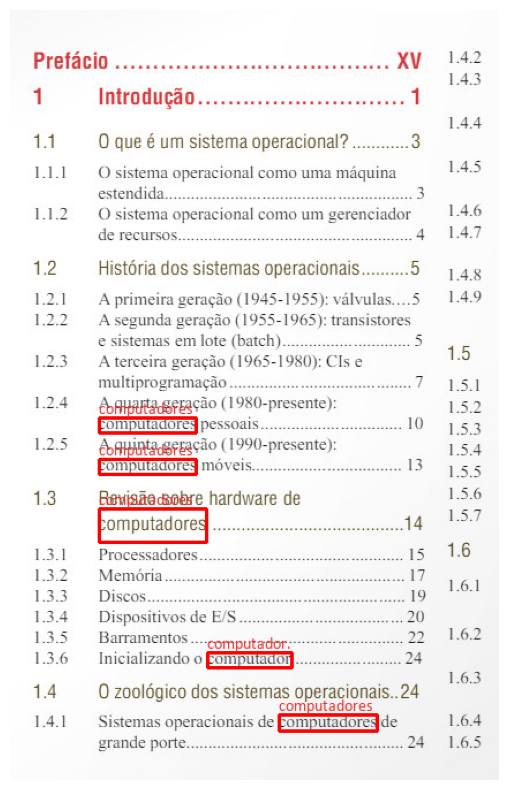

caixa-refrigerador.jpg
Number of times term computador appears in caixa-refrigerador.jpg: 0


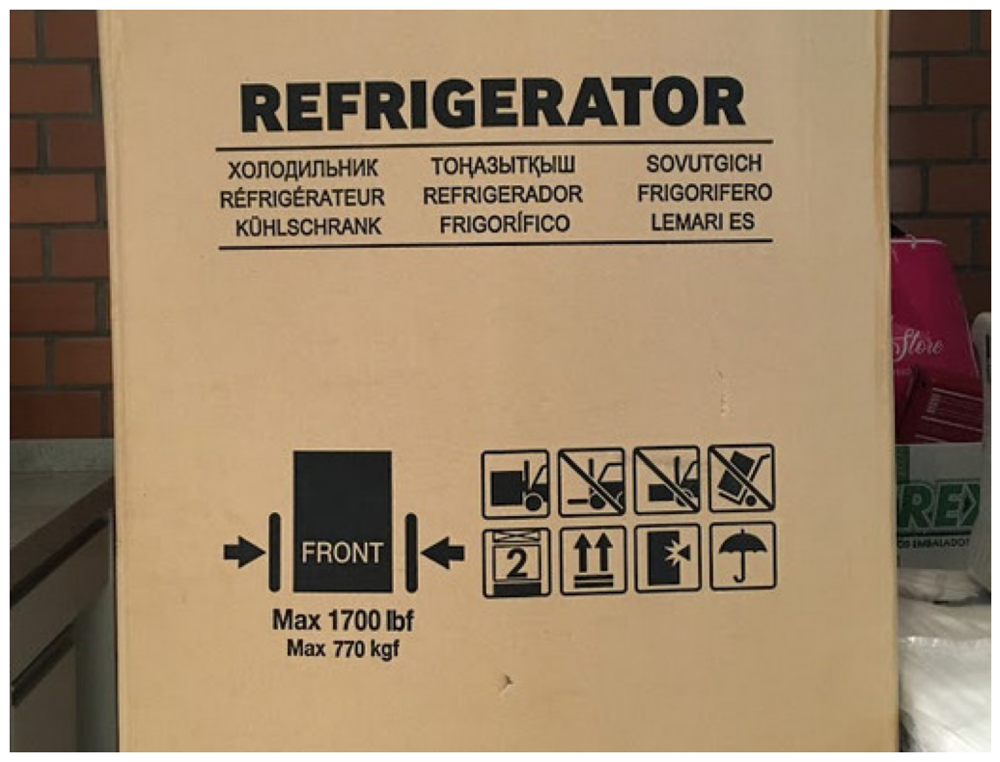

In [36]:
term_search = 'computador'
for image in paths:
    img = cv2.imread(image)
    img_original = img.copy()
    file_image = os.path.split(image)[-1]
    print('============\n' + str(file_image))
    
    img, number_of_times = ocr_process_image(img, term_search, config_tesseract, min_conf)
    print(f'Number of times term {term_search} appears in {file_image}: {number_of_times}')
    print('\n')
    show_img(img)

### Saving the results

In [37]:
term_search = 'sopa'

In [38]:
os.makedirs('processed_images', exist_ok=True)

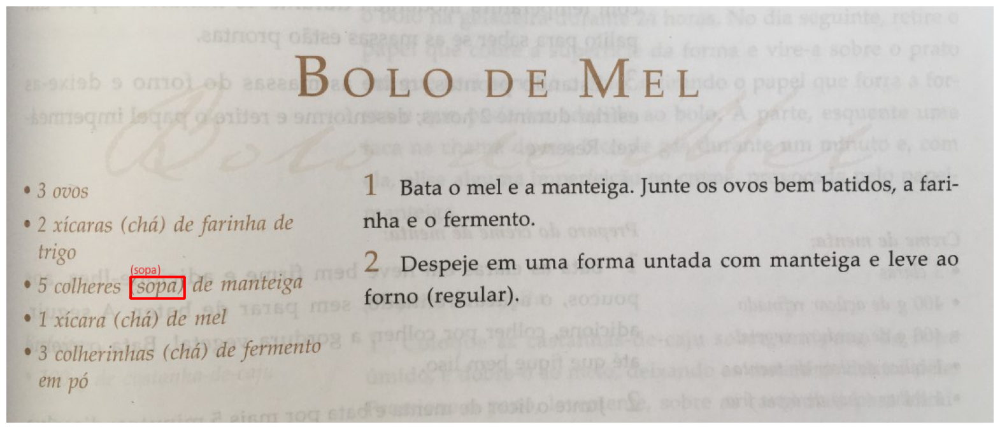

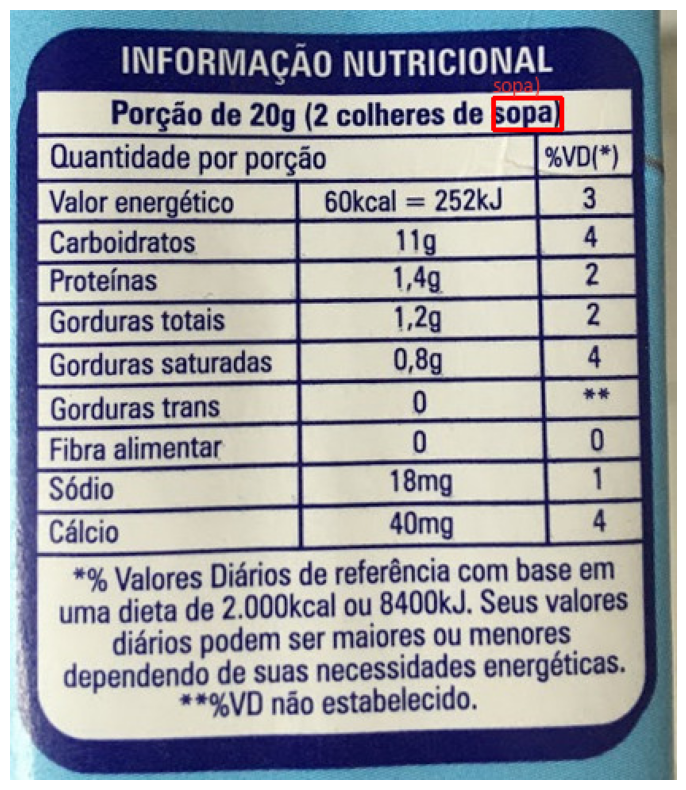

In [39]:
for image in paths:
    img = cv2.imread(image)
    img_original = img.copy()
    file_image = os.path.split(image)[-1]
    img, number_of_times = ocr_process_image(img, term_search, config_tesseract, min_conf)
    if number_of_times > 0:
        show_img(img)
        new_file_image = 'process_' + file_image
        new_image = 'processed_images/' + str(new_file_image)
        cv2.imwrite(new_image, img)